#  QUESTION PRACTICE
# Structural Dynamics - Eigen Value Analysis Of Mdof System


**Question: Find the natural time period of the following building**
| Floor | Lumped Mass | Stiffness of Individual Column in Story |
|--|--|--|
| 1st | 2 $kips \cdot s^2 /inch$ | 1800 $kips /inch$ |
| 2nd | 1.5 $kips \cdot s^2 /inch$ | 1200 $kips /inch$ |
| 3rd | 1 $kips \cdot s^2 /inch$ | 600 $kips /inch$ |

**The model has lumped mass at each story and only 3 DoFs**
Answer: 
- Fundamental Time Period = $.432 s$ 

In [1]:
import openseespy.opensees as ops
import opsvis as ovs
import numpy as np
import matplotlib.pyplot as plt

## Units Conversion

In [2]:
#length conversion
m = 1.0
cm = 0.01*m # centimeter, needed for displacement input in MultipleSupport excitation
mm = 0.001*m
inch = m/39.37
ft = 12.*inch 

#area conversion
sqinch = inch**2
inch4 = inch**4

#ksi to pa
pa = 1.0
kpa = 1000*pa
Mpa = 1000*kpa
ksi = 6.89*1000*kpa  #ksi = kip / sqinch
psi = ksi/1000.


#kip to kN
N = 1.0
kN = 1000 * N
kip = 4.45 * kN

# pound to kg
kg = 1 
pound = 0.453592 * kg
lbf = psi*inch**2  #pounds force
pcf = lbf/pow(ft, 3) #pounds per cubic foot
psf = lbf/pow(ft, 2) #pounds per square foot


# acceleration due to gravity
g = 9.81 #m/s^2

#time
sec = 1.0


## Model Variables

- For time period analysis we will calculate section dimensions based on given data for stiffness of each column in story

In [3]:
### GEOMETRIC DATA ###
# storey height: 
h = 120.*inch       #same height for all storey 

storey = h
span = 2. *storey

x_coors = np.array([0.0, span])
y_coors = np.array([0.0, storey, 2 * storey, 3*storey])


# masses
mass_floor = np.array([2, 1.5, 1])*(kip/inch)*sec**2
#floor stiffness
k_floor = np.array([1500, 1200, 600])*kip/inch
E = 2e11 * N/m**2


# finding section data using E, h and k
I_floor = (k_floor/2)*h**3/(12*E)
b_col = (I_floor*12)**(1/4)
A_col = b_col**2


numModes = 3





## Model Definition

<Axes: >

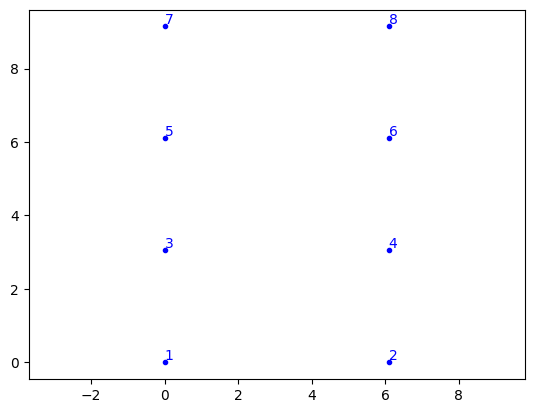

In [4]:
ops.wipe()
ops.model('basic', '-ndm', 2, '-ndf', 3)
#defining nodes

for j,y in enumerate(y_coors):
    for i,x in enumerate(x_coors):
        nodeTag = i + j * len(x_coors) + 1 
        ops.node(nodeTag, *[x, y])

ovs.plot_model()

In [5]:
ops.fix(1 , *[1,1,1])
ops.fix(2, *[1,1,1])

In [6]:
#assigning mass at nodes 3,4,5,6
#Masses are assigned at nodes 3, 4, 5, and 6 using mass command. 
#Since the considered shear frame system has only two degrees of freedom (displacements in x at the 1st and the 2nd storey),
#the masses have to be assigned in x direction only.

ops.mass(3, *[mass_floor[0]/2 , 0, 0])
ops.mass(4, *[mass_floor[0]/2, 0, 0])
ops.mass(5, *[mass_floor[1]/2, 0, 0])
ops.mass(6, *[mass_floor[1]/2, 0, 0])
ops.mass(7, *[mass_floor[2]/2, 0, 0])
ops.mass(8, *[mass_floor[2]/2, 0, 0])

In [7]:
#The geometric transformation with id tag 1 is defined to be linear.

linTrans = 1
pDelta = 2
ops.geomTransf('Linear', linTrans)

In [8]:

#create elastic element with following properties:
# 1 = tag for the element as shown in fig 2 
# 1, 3 = between nodes 1 and 3
# Ac/Ab  Area of column/beam
# Ic\Ib Mom. of inertia of column\beam
# Ec/Eb = Modulus of elasticity of Column/Beam


Ab = np.max(A_col)
Ib = 100*np.max(I_floor)
Ec = E

ops.element('elasticBeamColumn', 1, *[1, 3], A_col[0], Ec, I_floor[0], linTrans)
ops.element('elasticBeamColumn', 2, *[3, 5], A_col[1], Ec, I_floor[1], linTrans)
ops.element('elasticBeamColumn', 3, *[5, 7], A_col[2], Ec, I_floor[2], linTrans)
ops.element('elasticBeamColumn', 4, *[2, 4], A_col[0], Ec, I_floor[0], linTrans)
ops.element('elasticBeamColumn', 5, *[4, 6], A_col[1], Ec, I_floor[1], linTrans)
ops.element('elasticBeamColumn', 6, *[6, 8], A_col[2], Ec, I_floor[2], linTrans)
ops.element('elasticBeamColumn', 7, *[3, 4], Ab, Ec, Ib, linTrans)
ops.element('elasticBeamColumn', 8, *[5, 6], Ab, Ec, Ib, linTrans)
ops.element('elasticBeamColumn', 9, *[7, 8], Ab, Ec, Ib, linTrans)

<Axes: >

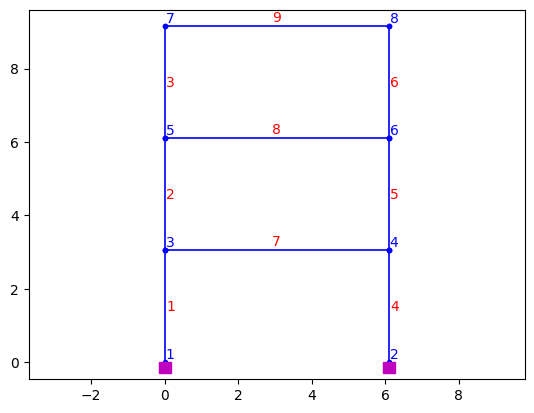

In [9]:
ovs.plot_model()

**To comply with the assumptions of the shear frame (no vertical displacemnts and rotations at nodes) end nodes of the beams are constrained to each other in the 2nd DOF (vertical displacement) and the 3rd DOF (rotation). EqualDOF command is used to imply these constraints.**

In [10]:
ops.equalDOF(3, 4, 2, 3)  #follow refrence node 3 and apply it to node 4 and constraint the 2nd dof(vertical displacement) and 3rd DOF(rotation)
ops.equalDOF(5, 6, 2, 3) 
ops.equalDOF(7, 8, 2, 3) 




### equalDOF Constraints in OpenSees
The equalDOF command in OpenSees is used to define a multi-point constraint between nodes. This means it allows you to tie the degrees of freedom (DOFs) of one node to the corresponding DOFs of another node. In simpler terms, the constrained node will mimic the movements and rotations of the reference node for the specified DOFs.

Here's a breakdown of what you need to know about equalDOF:

**Purpose:**

Enforce equal displacements and rotations (DOFs) between multiple nodes.
Useful for modeling rigid elements, diaphragms, or connecting points where nodes should move together.
Command format:

`equalDOF nd1 dof1_1 dof1_2 ... dof1_n nd2 dof2_1 dof2_2 ... dof2_n`
* `nd1`: Tag of the reference node (node whose DOFs are followed)
* `dof1_i`: List of DOFs at `nd1` to be constrained (1-ndf, ndf being the number of nodal DOFs)
* `nd2`: Tag of the constrained node (node whose DOFs follow `nd1`)
* `dof2_i`: List of DOFs at `nd2` to be constrained (corresponding to `dof1_i`)

**Example:**
`equalDOF 2 1 3 5 3 1 3 5;`
This command enforces the following:

- The x-translation (DOF 1), z-translation (DOF 3), and y-rotation (DOF 5) of node 3 will be equal to the corresponding DOFs of node 2.

**Key points to remember:**

- You can specify any number of DOFs from both nodes.
- The order of DOFs listed for each node should be the same.
- equalDOF creates a penalty-based constraint, meaning a large stiffness is applied to enforce the equal DOF condition.
- Choose a penalty stiffness large enough to effectively enforce the constraint without causing numerical issues.
- Use equalDOF with caution for large models as it can increase computational cost.

**Additional resources:**

OpenSees Documentation: https://opensees.berkeley.edu/wiki/index.php/EqualDOF_command
OpenSeesWiki: https://opensees.berkeley.edu/wiki/index.php/EqualDOF_command
I hope this explanation helps! Feel free to ask if you have any further questions about equalDOF or OpenSees in general.




#### For the specified number of eigenvalues (numModes) (for this example it is 3) the eigenvectors are recorded at all nodes in all DOFs using node recorder command

In [11]:
#eigen value analysis
lamda = ops.eigen(numModes)

omegas = []
freqs = []
T = []
for lam in lamda:
    omega = np.sqrt(lam)
    freq  = omega/(2*np.pi)
    omegas.append(omega)
    freqs.append(freq)
    T.append(1/freq)

In [12]:
omegas

[13.775421452485412, 29.963505313874492, 45.20251335719667]

In [13]:
print(f"The time period at 3 modes are: {T}")
print(f"The Fundamental period is: {max(T)}")
print(f"The Fundamental frequency is: {min(freqs)}")

The time period at 3 modes are: [0.4561156498080101, 0.2096946015281523, 0.13900079532146728]
The Fundamental period is: 0.4561156498080101
The Fundamental frequency is: 2.19242641733719


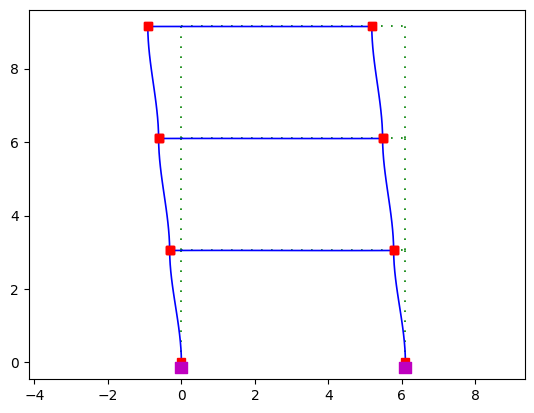

In [14]:
ovs.plot_mode_shape(1)

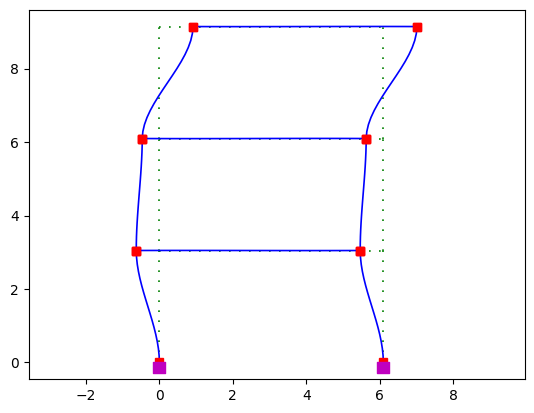

In [15]:
ovs.plot_mode_shape(2)

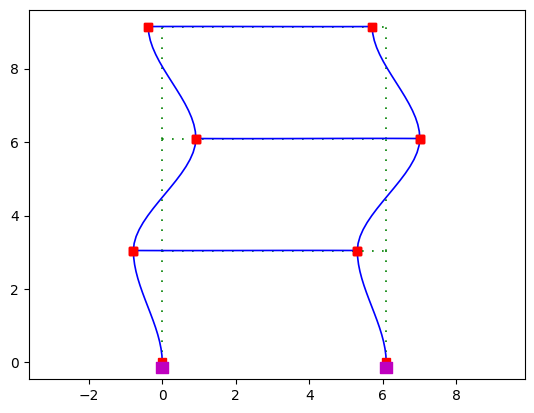

In [16]:
ovs.plot_mode_shape(3)

### Lets try getting eigen vectors for each modes of vibration and plot by ourself

In [17]:
right_nodes = [2, 4, 6, 8]

mode_1 = []
mode_2 = []
mode_3 = []


print(mode_1, mode_2, mode_3)

for imode in range(3):
    print(f'\nMode {imode+1}')
    for node in right_nodes:
        eig_val = ops.nodeEigenvector(node, imode+1, 1)
        print(f"node {node} ", eig_val)
        exec(f'mode_{int(imode+1)}.append(eig_val)')


print(mode_1)
print(mode_2)
print(mode_3)

[] [] []

Mode 1
node 2  0.0
node 4  -0.0006006133400229948
node 6  -0.0011654233915516015
node 8  -0.001717290392886971

Mode 2
node 2  0.0
node 4  -0.0010752245103901764
node 6  -0.0007967406896792098
node 8  0.0015631594604899246

Mode 3
node 2  0.0
node 4  -0.0011563278774590173
node 6  0.001346195991685035
node 8  -0.0005615361002388541
[0.0, -0.0006006133400229948, -0.0011654233915516015, -0.001717290392886971]
[0.0, -0.0010752245103901764, -0.0007967406896792098, 0.0015631594604899246]
[0.0, -0.0011563278774590173, 0.001346195991685035, -0.0005615361002388541]


In [18]:

mode_1 = np.array(mode_1)/mode_1[3]
mode_2 = np.array(mode_2)/mode_2[3]
mode_3 = np.array(mode_3)/mode_3[3]

In [19]:
mode_1       #gives eigen vectors for mode_1 (1st floor, 2nd floor and 3rd floor)

array([-0.        ,  0.34974477,  0.67864084,  1.        ])

In [20]:
y_coors

array([0.        , 3.0480061 , 6.09601219, 9.14401829])

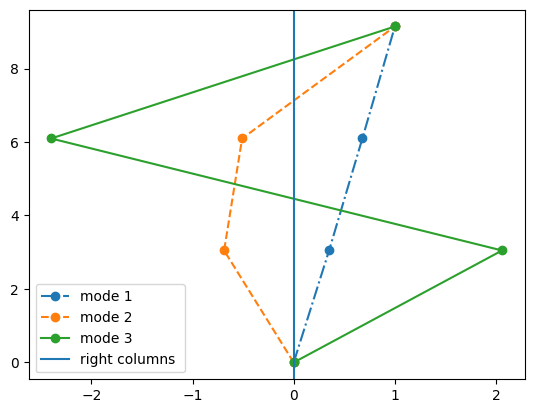

In [21]:
plt.plot(mode_1, y_coors, '-.o', label='mode 1')
plt.plot(mode_2, y_coors, '--o', label='mode 2')
plt.plot(mode_3, y_coors, '-o', label='mode 3')
plt.axvline(0, label='right columns ')
plt.legend()

### This is straight line and not much intuitative, lets try to plot with smooth fitted lines

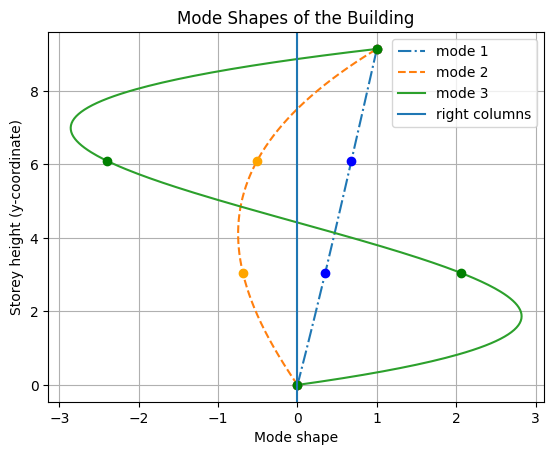

In [22]:
from scipy.interpolate import interp1d, splrep, splev


# Generate a dense range of y-coordinates for smooth plotting
y_dense = np.linspace(y_coors.min(), y_coors.max(), 300)

# Interpolate each mode shape
mode_1_smooth = splev(y_dense, splrep(y_coors, mode_1))
mode_2_smooth = splev(y_dense, splrep(y_coors, mode_2))
mode_3_smooth = splev(y_dense, splrep(y_coors, mode_3))

# Plot the smooth curves
plt.plot(mode_1_smooth, y_dense, '-.', label='mode 1')
plt.plot(mode_2_smooth, y_dense, '--', label='mode 2')
plt.plot(mode_3_smooth, y_dense, '-', label='mode 3')
plt.plot(mode_1, y_coors, 'o', c='blue')
plt.plot(mode_2, y_coors, 'o', c='orange')
plt.plot(mode_3, y_coors, 'o', c='green')

plt.axvline(0, label='right columns')
plt.legend()
plt.xlabel('Mode shape')
plt.ylabel('Storey height (y-coordinate)')
plt.title('Mode Shapes of the Building')
plt.grid(True)
plt.show()

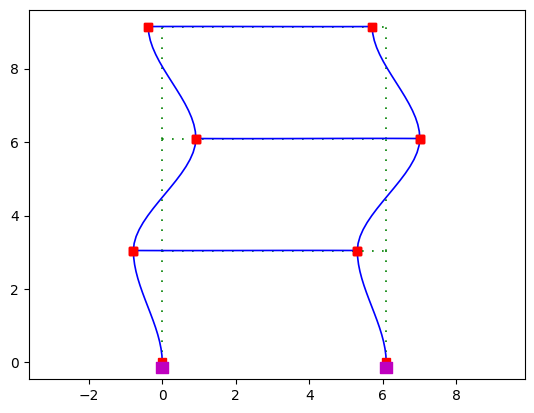

In [23]:
ovs.plot_mode_shape(3)

### Applying Initial Conditions for free vibration analysis

In [24]:

#ops.sp(4, 1, 0.3)
#ops.sp(6, 1, .8)
#ops.sp(8, 1, .3)

In [25]:
ops.setNodeDisp(4, 1, .3, '-commit')
ops.setNodeDisp(6, 1, .8, '-commit')
ops.setNodeDisp(8, 1, .3, '-commit')
ops.setNodeDisp(3, 1, .3, '-commit')
ops.setNodeDisp(5, 1, .8, '-commit')
ops.setNodeDisp(7, 1, .3, '-commit')

1.143002286004572

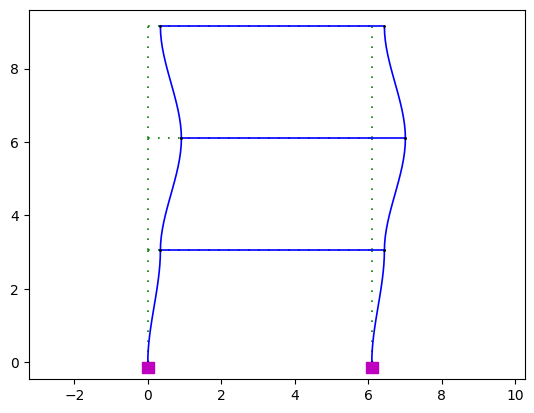

In [26]:
ovs.plot_defo()

In [28]:
def setRayleighDamping(lambda_):
    # define DAMPING--------------------------------------------------------------------------------------
    # apply Rayleigh DAMPING from $xDamp
    # D=$alphaM*M + $betaKcurr*Kcurrent + $betaKcomm*KlastCommit + $beatKinit*$Kinitial
    xDamp= 0.02;                        # 2% damping ratio		# eigenvalue mode 1
    omega = pow(lambda_[0],0.5)
    alphaM =  0.				        # M-prop. damping; D = alphaM*M
    betaKcurr =  0.         			# K-proportional damping;      +beatKcurr*KCurrent
    betaKcomm =  2.*xDamp/omega  	    # K-prop. damping parameter;   +betaKcomm*KlastCommitt
    betaKinit =  0.		                # initial-stiffness proportional damping      +beatKinit*Kini
    # define damping
    ops.rayleigh(alphaM, betaKcurr, betaKinit, betaKcomm) # RAYLEIGH damping



setRayleighDamping(lamda)

In [29]:
#ops.constraints("Transformation")
#ops.numberer("RCM")
#ops.system("UmfPack")
#ops.algorithm("Newton")
#ops.test("NormDispIncr", 1e-6, 100)
#ops.integrator("Newmark", 0.5, .25)


ops.timeSeries('Linear', 1)
#ops.pattern('Plain', 100, 1)
ops.analysis("Transient")

timestep  = 0.01
Duration = 2.5
Nsteps = int(Duration/timestep)

In [30]:
ops.recorder('Node', '-file', 'test_disp.txt', '-timeSeries', 1, '-time','-closeOnWrite', '-node', *[4,6,8], '-dof', 1, 'disp')

0

In [31]:
ops.record()

for i in range(Nsteps):
    ops.analyze(1, timestep)
    print(f"{i}/{Nsteps}")

0/250
1/250
2/250
3/250
4/250
5/250
6/250
7/250
8/250
9/250
10/250
11/250
12/250
13/250
14/250
15/250
16/250
17/250
18/250
19/250
20/250
21/250
22/250
23/250
24/250
25/250
26/250
27/250
28/250
29/250
30/250
31/250
32/250
33/250
34/250
35/250
36/250
37/250
38/250
39/250
40/250
41/250
42/250
43/250
44/250
45/250
46/250
47/250
48/250
49/250
50/250
51/250
52/250
53/250
54/250
55/250
56/250
57/250
58/250
59/250
60/250
61/250
62/250
63/250
64/250
65/250
66/250
67/250
68/250
69/250
70/250
71/250
72/250
73/250
74/250
75/250
76/250
77/250
78/250
79/250
80/250
81/250
82/250
83/250
84/250
85/250
86/250
87/250
88/250
89/250
90/250
91/250
92/250
93/250
94/250
95/250
96/250
97/250
98/250
99/250
100/250
101/250
102/250
103/250
104/250
105/250
106/250
107/250
108/250
109/250
110/250
111/250
112/250
113/250
114/250
115/250
116/250
117/250
118/250
119/250
120/250
121/250
122/250
123/250
124/250
125/250
126/250
127/250
128/250
129/250
130/250
131/250
132/250
133/250
134/250
135/250
136/250
137/250
138/25

In [32]:
data = np.loadtxt('test_disp.txt', delimiter=' ')

In [33]:
data

array([[0.      , 0.3     , 0.8     , 0.3     ],
       [0.01    , 0.311462, 0.795992, 0.317002],
       [0.02    , 0.326094, 0.752443, 0.353482],
       ...,
       [2.48    , 2.37361 , 2.2766  , 2.1879  ],
       [2.49    , 2.37892 , 2.27437 , 2.17318 ],
       [2.5     , 2.3863  , 2.27626 , 2.1646  ]])

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

time = data[:, 0]
displacement1 = data[:, 1]
displacement2 = data[:, 2]
displacement3 = data[:, 3]

# Heights of the stories
y_coors = [1, 2, 3]
height1 = y_coors[0]
height2 = y_coors[1]
height3 = y_coors[2]


fig, ax = plt.subplots()
ax.set_ylim(0, 4)  # Adjust according to the number of stories and their heights
ax.set_xlim(min(displacement1.min(), displacement2.min(), displacement3.min()), 
            max(displacement1.max(), displacement2.max(), displacement3.max()) + span)

line, = ax.plot([], [], 'o-', lw=2, label='Building Faces')
hz_line1, = ax.plot([], [], '-', lw=1)  # Horizontal line for first storey
hz_line2, = ax.plot([], [], '-', lw=1)  # Horizontal line for second storey
hz_line3, = ax.plot([], [], '-', lw=1)  # Horizontal line for third storey
time_text = ax.text(0.05, 0.95, '', transform=ax.transAxes)

ax.legend()

def init():
    line.set_data([], [])
    hz_line1.set_data([], [])
    hz_line2.set_data([], [])
    hz_line3.set_data([], [])
    time_text.set_text('')
    return line, hz_line1, hz_line2, hz_line3, time_text

def update(frame):
    # Define x and y coordinates for both faces separately
    x = [0, displacement1[frame], displacement2[frame], displacement3[frame], np.nan,  # First face
         span, span + displacement1[frame], span + displacement2[frame], span + displacement3[frame]]  # Second face
    y = [0, height1, height2, height3, np.nan,  # First face heights
         0, height1, height2, height3]  # Second face heights
    
    # np.nan is used to break the line between the two faces
    line.set_data(x, y)
    
    # Update horizontal lines
    hz_line1.set_data([displacement1[frame], span + displacement1[frame]], [height1, height1])
    hz_line2.set_data([displacement2[frame], span + displacement2[frame]], [height2, height2])
    hz_line3.set_data([displacement3[frame], span + displacement3[frame]], [height3, height3])
    
    # Update time text
    time_text.set_text(f'Time: {time[frame]:.2f}s')
    
    return line, hz_line1, hz_line2, hz_line3, time_text


ani = FuncAnimation(fig, update, frames=len(time), init_func=init, blit=True)

plt.xlabel('Displacement')
plt.ylabel('Height (Story Level)')
plt.title('Displacement of Building Stories Over Time')
plt.close()  # Prevents duplicate display in Jupyter Notebook
HTML(ani.to_jshtml())
